In [10]:
import sys
from os import path
import warnings
import logging

logging.disable(logging.CRITICAL)
warnings.filterwarnings('ignore')

SCRIPT_DIR = path.dirname(path.abspath('__file__'))
sys.path.append(path.dirname(SCRIPT_DIR))
sys.dont_write_bytecode = True

In [11]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from datetime import timedelta

from darts.metrics import mape, rmse, mse
from darts.models.forecasting.baselines import NaiveSeasonal, NaiveDrift
from darts.models.forecasting.exponential_smoothing import ExponentialSmoothing
from darts.models.forecasting.fft import FFT
from darts.models.forecasting.prophet_model import Prophet
from darts.models.forecasting.tbats_model import TBATS
from darts.models.forecasting.theta import Theta
from darts.models.forecasting.xgboost import XGBModel
from darts.timeseries import TimeSeries
from darts.utils.statistics import check_seasonality

from typing import Any, Tuple, Union, Literal, Callable

from library.datasets import get_dataframe_summarized, standarize, StandarizeMethod
from library.depresjon import get_measured_days, read_activity_dataset, read_scores_dataset
from library.forecasting import pick_best_forecast_model_for_ts, split_time_series

from sklearn.model_selection import ParameterGrid
from sktime.utils.plotting import plot_series

%matplotlib inline

pd.set_option('display.max_columns', None)

In [12]:
def get_epsilon():
    return sys.float_info.epsilon

def transform_dataset(
    dataset_id: str,
    df: pd.DataFrame,
    frequency: str = '1T',
    summarize_method: str = 'sum',
    standarize_method: int = StandarizeMethod.DEFAULT,
    remove_outliers: bool = False
) -> pd.DataFrame:
    df_grouped = get_dataframe_summarized(df, frequency, summarize_method)
    df_grouped = df_grouped.rename(columns={'index': 'timestamp'})
    df_grouped['id'] = dataset_id
    df_grouped['activity'] = standarize(
        df_grouped.activity.to_numpy(),
        method = standarize_method,
        remove_outliers = remove_outliers
    )
    return df_grouped

def get_args_for_model(model_class: str):
    if model_class == 'NaiveSeasonal':
        return { 'K': 168 }
    
    if model_class == 'XGBModel':
        return { 'lags': 24, 'random_state': seed }
    
    if model_class == 'ExponentialSmoothing':
        return { 'random_state': seed }
    
    if model_class == 'Prophet':
        return { 'floor': 0 }
    
    if model_class == 'FFT':
        return { 'nr_freqs_to_keep': 24 }

    return {}

def load_forecasting_model(model_class: str, model_path: str) -> Any:
    module = sys.modules['darts.models'] if 'darts.models' in sys.modules else import_module('darts.models')
    args = get_args_for_model(model_class)
    instance = getattr(module, model_class)(**args)
    instance.load(model_path)
    return instance

In [13]:
pd.options.display.float_format = '{:.4f}'.format
plt.rcParams['figure.figsize'] = [20, 6]
plt.style.use('seaborn-v0_8')
seed = 123

random.seed(seed)
np.random.seed(seed)

DATASETS_PATH = path.realpath(path.join(SCRIPT_DIR, '..', '..', 'dataset'))

RESULTS_PATH = path.realpath(path.join(SCRIPT_DIR, '..', '..', 'results'))

FORECASTING_MODELS_PATH = path.realpath(
    path.join(RESULTS_PATH, 'forecasting', 'models')
)

FORECASTING_SCORES_PATH = path.realpath(
    path.join(RESULTS_PATH, 'forecasting', 'scores')
)

In [14]:
# scores dataset
df_scores = read_scores_dataset(f'{DATASETS_PATH}/original/scores.csv')
df_scores.head()

,days,gender,age,afftype,melanch,inpatient,edu,marriage,work,madrs1,madrs2
number,,,,,,,,,,,
condition_1,11,2,35-39,2.0000,2.0000,2.0000,6-10,1.0000,2.0000,19.0000,19.0000
condition_2,18,2,40-44,1.0000,2.0000,2.0000,6-10,2.0000,2.0000,24.0000,11.0000
condition_3,13,1,45-49,2.0000,2.0000,2.0000,6-10,2.0000,2.0000,24.0000,25.0000
condition_4,13,2,25-29,2.0000,2.0000,2.0000,11-15,1.0000,1.0000,20.0000,16.0000
condition_5,13,2,50-54,2.0000,2.0000,2.0000,11-15,2.0000,2.0000,26.0000,26.0000


In [15]:
hourly_activity_datasets = {}
for file, row in df_scores.iterrows():
    folder = file.split('_')[0]
    days = get_measured_days(df_scores, file)
    df = read_activity_dataset(f'{DATASETS_PATH}/original/{folder}/{file}.csv', days)
    
    hourly_activity_datasets[file] = {
        'mean': transform_dataset(
            file,
            df,
            frequency = '1H',
            summarize_method = 'mean',
            standarize_method = StandarizeMethod.ROBUST,
            remove_outliers = False
        ),
        'median': transform_dataset(
            file,
            df,
            frequency = '1H',
            summarize_method = 'median',
            standarize_method = StandarizeMethod.DEFAULT,
            remove_outliers = True
        )
    }
hourly_activity_datasets['condition_1']['mean'].head()

,timestamp,activity,id
0,2003-05-08 00:00:00,-0.6786,condition_1
1,2003-05-08 01:00:00,-0.7073,condition_1
2,2003-05-08 02:00:00,-0.6854,condition_1
3,2003-05-08 03:00:00,-0.7077,condition_1
4,2003-05-08 04:00:00,-0.6477,condition_1


In [16]:
df_results = pd.DataFrame(columns=[
    'number',
    'seasonality_mean',
    'seasonality_period_mean',
    'seasonality_median',
    'seasonality_period_median',
])
for file, dfs in hourly_activity_datasets.items():
    df_mean = TimeSeries.from_series(dfs['mean'].activity)
    df_median = TimeSeries.from_series(dfs['median'].activity)
    
    seasonality_mean, seasonality_period_mean = check_seasonality(df_mean)
    seasonality_median, seasonality_period_median = check_seasonality(df_median)
    
    df_results.loc[len(df_results)] = {
        'number': file,
        'seasonality_mean': seasonality_mean,
        'seasonality_period_mean': seasonality_period_mean,
        'seasonality_median': seasonality_median,
        'seasonality_period_median': seasonality_period_median
    }

df_results.set_index('number').T

number,condition_1,condition_2,condition_3,condition_4,condition_5,condition_6,condition_7,condition_8,condition_9,condition_10,condition_11,condition_12,condition_13,condition_14,condition_15,condition_16,condition_17,condition_18,condition_19,condition_20,condition_21,condition_22,condition_23,control_1,control_2,control_3,control_4,control_5,control_6,control_7,control_8,control_9,control_10,control_11,control_12,control_13,control_14,control_15,control_16,control_17,control_18,control_19,control_20,control_21,control_22,control_23,control_24,control_25,control_26,control_27,control_28,control_29,control_30,control_31,control_32
seasonality_mean,False,True,True,False,False,False,False,True,True,True,False,False,False,True,True,False,False,False,False,True,True,True,True,True,False,False,True,False,True,True,False,True,False,True,False,False,True,False,False,False,True,False,False,False,False,True,True,False,False,True,False,False,False,True,True
seasonality_period_mean,0,4,23,0,0,0,0,22,21,23,0,0,0,23,7,0,0,0,0,3,18,19,22,23,0,0,4,0,18,20,0,21,0,20,0,0,23,0,0,0,23,0,0,0,0,21,23,0,0,20,0,0,0,22,22
seasonality_median,False,False,True,False,False,True,False,True,True,True,True,False,False,True,True,True,False,False,False,True,True,True,True,True,False,False,True,False,True,True,False,True,False,True,False,False,True,False,False,True,False,False,False,False,False,True,True,False,False,True,True,False,False,True,True
seasonality_period_median,0,0,21,0,0,5,0,22,21,23,22,0,0,8,10,23,0,0,0,3,4,19,22,22,0,0,4,0,18,21,0,21,0,20,0,0,23,0,0,21,0,0,0,0,0,18,23,0,0,3,20,0,0,18,4


In [17]:
# load forecasting scores dataset
df_forecasting_scores_mape = read_scores_dataset(path.realpath(path.join(FORECASTING_SCORES_PATH, 'scores_forecasting_models__MAPE_min.csv')))
df_forecasting_scores_mape

,score_metric,criteria,best_model_mean,score_best_model_mean,model_file_mean,best_model_median,score_best_model_median,model_file_median
number,,,,,,,,
condition_1,MAPE,min,NaiveSeasonal,205.6857,condition_1__hourly_mean__NaiveSeasonal__MAPE_...,FFT,95.6316,condition_1__hourly_median__FFT__MAPE_min.pkl
condition_2,MAPE,min,XGBModel,210.7415,condition_2__hourly_mean__XGBModel__MAPE_min.pkl,NaiveSeasonal,236.4698,condition_2__hourly_median__NaiveSeasonal__MAP...
condition_3,MAPE,min,Prophet,187.5457,condition_3__hourly_mean__Prophet__MAPE_min.pkl,FFT,157.9000,condition_3__hourly_median__FFT__MAPE_min.pkl
condition_4,MAPE,min,FFT,354.0283,condition_4__hourly_mean__FFT__MAPE_min.pkl,ExponentialSmoothing,121.5665,condition_4__hourly_median__ExponentialSmoothi...
condition_5,MAPE,min,XGBModel,227.1525,condition_5__hourly_mean__XGBModel__MAPE_min.pkl,NaiveSeasonal,111.1078,condition_5__hourly_median__NaiveSeasonal__MAP...
condition_6,MAPE,min,NaiveSeasonal,733.3538,condition_6__hourly_mean__NaiveSeasonal__MAPE_...,ExponentialSmoothing,95.1518,condition_6__hourly_median__ExponentialSmoothi...
condition_7,MAPE,min,FFT,849.6745,condition_7__hourly_mean__FFT__MAPE_min.pkl,XGBModel,73.7476,condition_7__hourly_median__XGBModel__MAPE_min...
condition_8,MAPE,min,Prophet,146.2775,condition_8__hourly_mean__Prophet__MAPE_min.pkl,XGBModel,196.1317,condition_8__hourly_median__XGBModel__MAPE_min...
condition_9,MAPE,min,ExponentialSmoothing,186.9724,condition_9__hourly_mean__ExponentialSmoothing...,FFT,156.8860,condition_9__hourly_median__FFT__MAPE_min.pkl


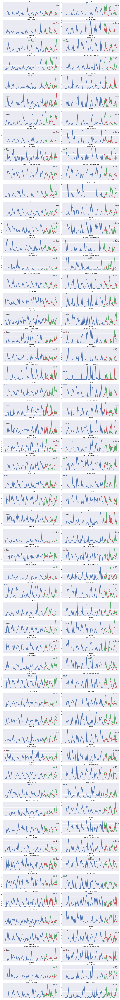

In [18]:
fig, axes = plt.subplots(
    nrows = len(hourly_activity_datasets),
    ncols = 2,
    figsize = (20, len(hourly_activity_datasets) * 3)
)

index = 0
for id, row in df_forecasting_scores_mape.iterrows():
    df_mean = hourly_activity_datasets[id]['mean'].set_index('timestamp')
    df_median = hourly_activity_datasets[id]['median'].set_index('timestamp')

    ts_hourly_mean = TimeSeries.from_series(df_mean.activity + get_epsilon())
    ts_hourly_median = TimeSeries.from_series(df_median.activity + get_epsilon())
    
    forecasting_model_mean = load_forecasting_model(
        model_class = row['best_model_mean'],
        model_path = path.realpath(
            path.join(RESULTS_PATH, 'forecasting', 'models', row['model_file_mean'])
        )
    )
    
    forecasting_model_median = load_forecasting_model(
        model_class = row['best_model_median'],
        model_path = path.realpath(
            path.join(RESULTS_PATH, 'forecasting', 'models', row['model_file_median'])
        )
    )
    
    train_mean, test_mean = split_time_series(ts_hourly_mean, 3)
    forecasting_model_mean.fit(train_mean)
    
    train_median, test_median = split_time_series(ts_hourly_median, 3)
    forecasting_model_median.fit(train_median)
    
    # plots mean
    ax0 = axes[index, 0]
    train_mean.plot(label='train', ax=ax0, xticks=[])
    test_mean.plot(label='test', ax=ax0, xticks=[])
    forecasting_model_mean.predict(len(test_mean)).plot(label='prediction', ax=ax0, xticks=[])
    ax0.set_title('{} - {}'.format(id, forecasting_model_mean.__class__.__name__))

    # plots median
    ax1 = axes[index, 1]
    train_median.plot(label='train', ax=ax1, xticks=[])
    test_median.plot(label='test', ax=ax1, xticks=[])
    forecasting_model_median.predict(len(test_median)).plot(label='prediction', ax=ax1, xticks=[])
    ax1.set_title('{} - {}'.format(id, forecasting_model_median.__class__.__name__))

    index += 1

fig.tight_layout()
plt.show()

In [19]:
df_forecasting_scores_rmse = read_scores_dataset(path.realpath(path.join(FORECASTING_SCORES_PATH, 'scores_forecasting_models__RMSE_min.csv')))
df_forecasting_scores_rmse

,score_metric,criteria,best_model_mean,score_best_model_mean,model_file_mean,best_model_median,score_best_model_median,model_file_median
number,,,,,,,,
condition_1,RMSE,min,Prophet,0.7562,condition_1__hourly_mean__Prophet__RMSE_min.pkl,ExponentialSmoothing,0.6521,condition_1__hourly_median__ExponentialSmoothi...
condition_2,RMSE,min,FFT,0.6246,condition_2__hourly_mean__FFT__RMSE_min.pkl,Prophet,0.5417,condition_2__hourly_median__Prophet__RMSE_min.pkl
condition_3,RMSE,min,Prophet,0.7164,condition_3__hourly_mean__Prophet__RMSE_min.pkl,Prophet,0.6985,condition_3__hourly_median__Prophet__RMSE_min.pkl
condition_4,RMSE,min,Prophet,1.2534,condition_4__hourly_mean__Prophet__RMSE_min.pkl,Prophet,1.1689,condition_4__hourly_median__Prophet__RMSE_min.pkl
condition_5,RMSE,min,Prophet,0.8866,condition_5__hourly_mean__Prophet__RMSE_min.pkl,ExponentialSmoothing,0.7951,condition_5__hourly_median__ExponentialSmoothi...
condition_6,RMSE,min,Prophet,0.6564,condition_6__hourly_mean__Prophet__RMSE_min.pkl,Prophet,0.8126,condition_6__hourly_median__Prophet__RMSE_min.pkl
condition_7,RMSE,min,Prophet,1.4399,condition_7__hourly_mean__Prophet__RMSE_min.pkl,Prophet,1.2051,condition_7__hourly_median__Prophet__RMSE_min.pkl
condition_8,RMSE,min,Prophet,1.1244,condition_8__hourly_mean__Prophet__RMSE_min.pkl,Prophet,0.7099,condition_8__hourly_median__Prophet__RMSE_min.pkl
condition_9,RMSE,min,ExponentialSmoothing,0.7353,condition_9__hourly_mean__ExponentialSmoothing...,ExponentialSmoothing,0.7692,condition_9__hourly_median__ExponentialSmoothi...


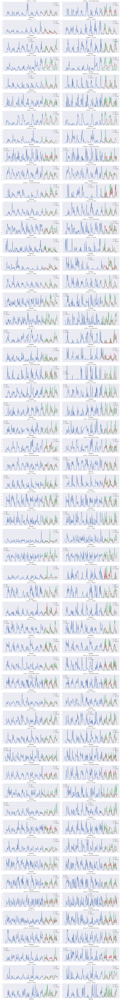

In [20]:
fig, axes = plt.subplots(
    nrows = len(hourly_activity_datasets),
    ncols = 2,
    figsize = (20, len(hourly_activity_datasets) * 3)
)

index = 0
for id, row in df_forecasting_scores_rmse.iterrows():
    df_mean = hourly_activity_datasets[id]['mean'].set_index('timestamp')
    df_median = hourly_activity_datasets[id]['median'].set_index('timestamp')

    ts_hourly_mean = TimeSeries.from_series(df_mean.activity + get_epsilon())
    ts_hourly_median = TimeSeries.from_series(df_median.activity + get_epsilon())
    
    forecasting_model_mean = load_forecasting_model(
        model_class = row['best_model_mean'],
        model_path = path.realpath(
            path.join(RESULTS_PATH, 'forecasting', 'models', row['model_file_mean'])
        )
    )
    
    forecasting_model_median = load_forecasting_model(
        model_class = row['best_model_median'],
        model_path = path.realpath(
            path.join(RESULTS_PATH, 'forecasting', 'models', row['model_file_median'])
        )
    )
    
    train_mean, test_mean = split_time_series(ts_hourly_mean, 3)
    forecasting_model_mean.fit(train_mean)
    
    train_median, test_median = split_time_series(ts_hourly_median, 3)
    forecasting_model_median.fit(train_median)
    
    # plots mean
    ax0 = axes[index, 0]
    train_mean.plot(label='train', ax=ax0, xticks=[])
    test_mean.plot(label='test', ax=ax0, xticks=[])
    forecasting_model_mean.predict(len(test_mean)).plot(label='prediction', ax=ax0, xticks=[])
    ax0.set_title('{} - {}'.format(id, forecasting_model_mean.__class__.__name__))

    # plots median
    ax1 = axes[index, 1]
    train_median.plot(label='train', ax=ax1, xticks=[])
    test_median.plot(label='test', ax=ax1, xticks=[])
    forecasting_model_median.predict(len(test_median)).plot(label='prediction', ax=ax1, xticks=[])
    ax1.set_title('{} - {}'.format(id, forecasting_model_median.__class__.__name__))

    index += 1

fig.tight_layout()
plt.show()